# Рынок заведений общественного питания Москвы

**Описание проекта**

Поставлена задача - подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места, чтобы открыть заведение общественного питания в Москве.

**Описание данных**

Файл moscow_places.csv:
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
  - «Средний счёт: 1000–1500 ₽»;
  - «Цена чашки капучино: 130–220 ₽»;
  - «Цена бокала пива: 400–600 ₽».
  - и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
 - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
 - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
 - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
 - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
 - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
 - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
 - 0 — заведение не является сетевым
 - 1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

In [ ]:
#Импорт библиотек
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
 
from collections import Counter
from scipy import stats as st
 
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go

import plotly.io as pio

#Импорт карты, хороплета и маркера
from folium import Map, Choropleth, Marker
#Импорт кластера
from folium.plugins import MarkerCluster

In [ ]:
#Загрузим датасет
data = pd.read_csv('/datasets/moscow_places.csv')

In [ ]:
data.sample(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2909,Шаурма,кафе,"Москва, Преображенская улица, 5/7",Восточный административный округ,"пн-пт 09:00–21:00; сб,вс 10:00–21:00",55.795543,37.706296,4.1,средние,Средний счёт:200–400 ₽,300.0,NaN,0,43.0
2345,Фудмаркет,столовая,"Москва, улица Академика Королёва, 13, стр. 4",Северо-Восточный административный округ,пн-пт 08:30–17:50,55.820119,37.619310,4.3,средние,Средний счёт:350–500 ₽,425.0,NaN,1,NaN
134,Van House,быстрое питание,"Москва, Дмитровское шоссе, 163Ак1",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.909222,37.540704,4.4,NaN,NaN,NaN,NaN,0,NaN
1987,Frankie Pizza,пиццерия,"Москва, Новослободская улица, 24, стр. 1",Центральный административный округ,"ежедневно, 11:00–00:00",55.782864,37.598243,4.5,средние,Средний счёт:500–1300 ₽,900.0,NaN,1,217.0
4229,Мармарис,"бар,паб","Москва, улица Арбат, 22/2с1",Центральный административный округ,"ежедневно, 10:00–03:00",55.750038,37.593066,3.7,NaN,NaN,NaN,NaN,0,NaN
1089,Шаурма,кафе,"Москва, Енисейская улица, 22, корп. 2",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.868973,37.664836,4.4,NaN,NaN,NaN,NaN,0,225.0
1602,Пиццерия,ресторан,"Москва, Старопетровский проезд, 14, стр. 1",Северный административный округ,NaN,55.824865,37.509699,4.4,NaN,NaN,NaN,NaN,0,40.0
4296,Шоколадница,кофейня,"Москва, улица Арбат, 1",Центральный административный округ,"пн-ср 08:00–23:00; чт 08:00–00:00; пт,сб кругл...",55.751841,37.598837,4.2,NaN,NaN,NaN,NaN,1,480.0
5065,Bổ,быстрое питание,"Москва, улица Балчуг, 5",Центральный административный округ,"пн-чт 11:00–22:00; пт,сб 11:00–23:00; вс 11:00...",55.747173,37.626223,4.5,NaN,NaN,NaN,NaN,1,295.0
5208,Зелёная Сила,кафе,"Москва, Таганская площадь, 86/1с1",Центральный административный округ,"ежедневно, 10:00–22:00",55.741605,37.652648,3.3,средние,Средний счёт:150–1000 ₽,575.0,NaN,0,NaN


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [ ]:
#Проверим датафрейм на явные дубликаты
data.duplicated().sum()

0

In [ ]:
#Приведем столбец с названиями к нижнему регистру:
data['name'] = data['name'].str.lower()

In [ ]:
#Проверим дубликаты по адресу и названию заведения:
data[data[['name', 'address']].duplicated()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [ ]:
#Удалим неявные дубликаты
data = data.drop_duplicates(subset=['name', 'address'])

In [ ]:
#Вычислим общее количество пропущенных значений в каждом столбце датафрейма
data.isnull().sum().sort_values(ascending=False) 

middle_coffee_cup    7868
middle_avg_bill      5254
price                5088
avg_bill             4587
seats                3611
hours                 535
name                    0
category                0
address                 0
district                0
lat                     0
lng                     0
rating                  0
chain                   0
dtype: int64

## Предобработка данных

In [ ]:
#Создадим столбец street с названиями улиц
data['street'] = data['address'].str.split(', ').str[1]
data['street'].value_counts()

проспект Мира                           183
Профсоюзная улица                       122
проспект Вернадского                    108
Ленинский проспект                      107
Ленинградский проспект                   95
                                       ... 
улица Ремизова                            1
природно-исторический парк Измайлово      1
улица Ивана Франко                        1
площадь Савёловского Вокзала              1
улица Малая Якиманка                      1
Name: street, Length: 1448, dtype: int64

In [ ]:
#Создадим столбец is_24/7 (круглосуточно работающие заведения)
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')

In [ ]:
#Проверим новые столбцы
data.sample(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
6036,лапша ланьчжоу,ресторан,"Москва, Ломоносовский проспект, 25, корп. 5",Западный административный округ,"ежедневно, 11:00–21:00",55.692339,37.531690,4.4,средние,Средний счёт:500 ₽,500.0,NaN,0,60.0,Ломоносовский проспект,False
5998,батони,ресторан,"Москва, улица Кржижановского, 22с1",Юго-Западный административный округ,"ежедневно, 11:30–00:00",55.677771,37.574158,4.3,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,1,NaN,улица Кржижановского,False
1246,настоящие хот-доги,кафе,"Москва, Северо-Западный административный округ...",Северо-Западный административный округ,"пн-пт 11:00–19:00; сб,вс 11:00–20:00",55.801435,37.417345,3.9,NaN,NaN,NaN,NaN,0,NaN,Северо-Западный административный округ,False
4784,ланч и кофе,кофейня,"Москва, Таможенный проезд, 6, стр. 9",Юго-Восточный административный округ,пн-сб 08:00–20:00,55.751592,37.679505,4.3,средние,Средний счёт:200–400 ₽,300.0,NaN,0,NaN,Таможенный проезд,False
6465,ryba kit,ресторан,"Москва, улица Авиаконструктора Миля, 3А",Юго-Восточный административный округ,"пн-чт 09:00–22:00; пт,сб 09:00–23:00; вс 09:00...",55.686800,37.851659,3.8,NaN,NaN,NaN,NaN,0,NaN,улица Авиаконструктора Миля,False


В 6 столбцах наблюдается высокий процент пропущенных значений, удалять специально строки с пропусками не будем т.к. это негативно отобразится на результатах исследования.

## Анализ данных

### Категории заведений.

In [ ]:
#Посмотрим, какие есть категории заведений
cat = data['category'].value_counts()
cat

кафе               2377
ресторан           2042
кофейня            1413
бар,паб             764
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

In [ ]:
#Построим график
fig = px.bar(cat, y="category", text="category", color_discrete_sequence = px.colors.sequential.Aggrnyl)
fig.update_layout(
    title="Распределение количества заведений по категориям",
    xaxis_title="Категории заведений",
    yaxis_title="Количество заведений"
)
fig.show()

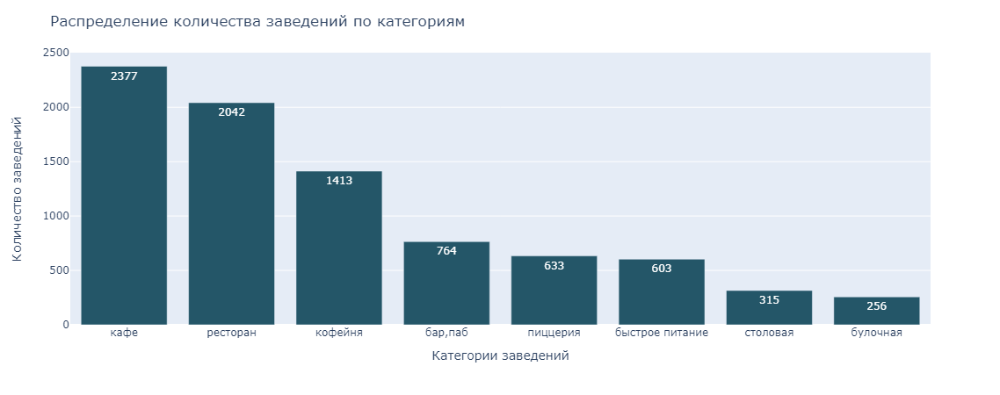

В данных представлено 8 категорий заведений общественного питания.  Наибольшее количество заведений представлено в трёх категориях:
- кафе - 2377 или 28.3% от общего числа
- ресторан - 2042 или 24.3%  от общего числа
- кофейня - 1413 или 16.8% от общего числа

Наименьшее количество заведений представлено в двух категориях:
- столовая - 315 или 3.75% от общего числа
- булочная - 256 или 3.05% от общего числа

### Количество посадочных мест.

In [ ]:
data_seats = data.groupby('category').agg({'seats':'median'}).sort_values(by='seats', ascending=False).reset_index()
data_seats

,category,seats
0,ресторан,86.0
1,"бар,паб",82.0
2,кофейня,80.0
3,столовая,75.5
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


In [ ]:
fig = px.bar(data_seats, x="category", y="seats", text='seats', color_discrete_sequence = px.colors.sequential.Aggrnyl)
fig.update_layout(
    title="Распределение количества посадочных мест по категориям заведений",
    xaxis_title="Категории заведений",
    yaxis_title="Количество посадочных мест",
)
fig.show()

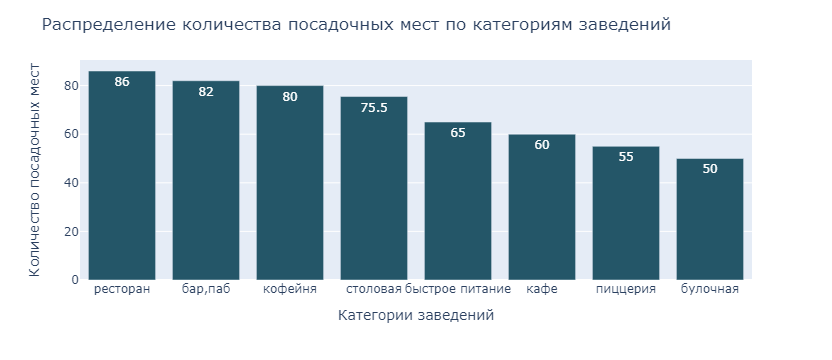

Меньше всего посадочных мест в заведениях, рассчитанных на непродолжительное пребывание посетителей - кафе, пиццерия, булочная. В свою очередь, рестораны и бары обладают наибольшим количеством мест.

### Соотношение сетевых и несетевых заведений.

In [ ]:
#Вычислим количество сетевых и несетевых заведений в датасете
print('Количество сетевых заведений:', data[data['chain']==1]['name'].count())
print('Количество несетевых заведений:', data[data['chain']==0]['name'].count())

Количество сетевых заведений: 3203
Количество несетевых заведений: 5200


In [ ]:
#Изобразим соотношение на круговой диаграмме
chain = data['chain'].value_counts()
fig = go.Figure(data=[go.Pie(labels=['несетевые', 'сетевые'], values=chain)]
               )
fig.update_layout(
    title="Соотношение сетевых и несетевых заведений")
fig.show()

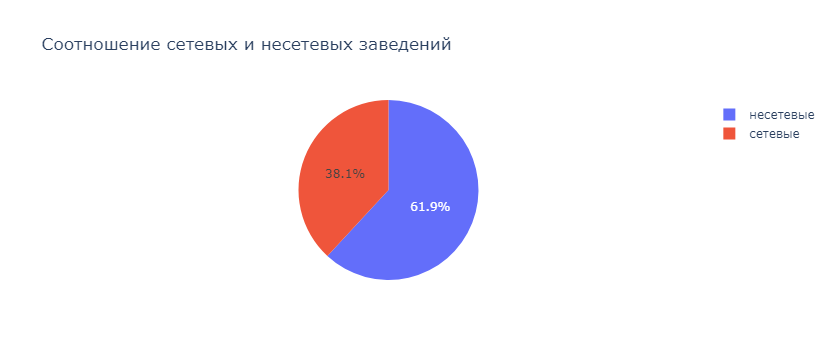

Более 60% заведений Москвы несетевые.

### Распространенные категории сетевых заведений.

In [ ]:
category_chain = data.query('chain == 1').groupby('category').agg({'name':'count'}).reset_index()
category_chain['percent'] =  (category_chain['name']*100/(data.groupby('category').agg({'name':'count'})\
                                                .reset_index()['name'])).round(2)
category_chain = category_chain.sort_values(by='percent', ascending=False)
category_chain

,category,name,percent
1,булочная,157,61.33
5,пиццерия,330,52.13
4,кофейня,720,50.96
2,быстрое питание,232,38.47
6,ресторан,729,35.70
3,кафе,779,32.77
7,столовая,88,27.94
0,"бар,паб",168,21.99


In [ ]:
fig = px.bar(category_chain, 
             x='category', 
             y='percent',
             text='percent',
             color_discrete_sequence = px.colors.sequential.Aggrnyl
            )
fig.update_layout(title="Распределение сетевых заведений от общего количества заведений по категориям",
    xaxis_title="Категории заведений",
    yaxis_title="Доля сетевых заведений")
fig.show() 

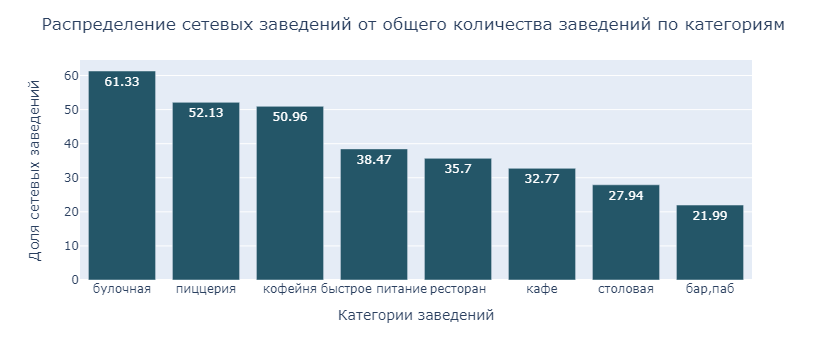

Наиболее индивидуальными заведениями являются, как правило, бары и пабы. В свою очередь, подавляющее количество булочных имеет сетевую структуру - более 60%.

### Топ-15 популярных сетей.

In [ ]:
#Выделим Топ-15 сетей, сгруппировав их только по названию
top_15_name = data.query('chain == 1').groupby(['name']).agg({'district' : 'count'}).reset_index().sort_values(by=['district'], ascending=False).head(15)
top_15_name

,name,district
729,шоколадница,120
335,домино'с пицца,76
331,додо пицца,74
146,one price coffee,71
742,яндекс лавка,69
58,cofix,65
168,prime,50
664,хинкальная,44
409,кофепорт,42
418,кулинарная лавка братьев караваевых,39


In [ ]:
fig = px.bar(top_15_name,
             x='district', 
             y='name',
             color_discrete_sequence = px.colors.sequential.Aggrnyl
            )

fig.update_layout(title='Количество заведений из топ-15 популярных сетей Москвы',
                   xaxis_title='Количество',
                   yaxis_title='Название',
                   yaxis={'categoryorder':'total ascending'},
                   width=900,
                   height=500
                 )
fig.show()

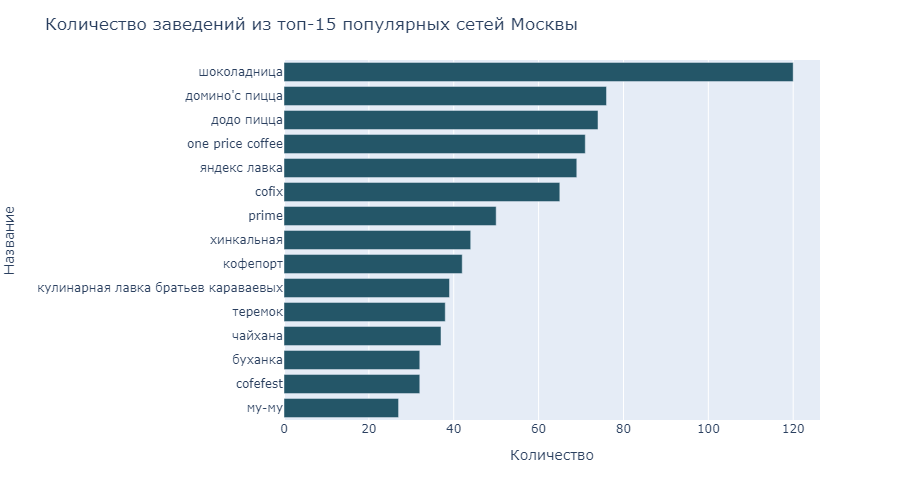

In [ ]:
#Сохраним в список названия заведений из Топ-15
set_cafe = ["шоколадница", "домино'с пицца", "додо пицца", "one price coffee", "яндекс лавка", "cofix", "prime",\
            "хинкальная", "кофепорт", "кулинарная лавка братьев караваевых", "теремок", "чайхана", "cofefest", "буханка", "му-му"]

In [ ]:
new_data = data[data['name'].isin(set_cafe)]
#Создадим сводную таблицу из списка заведений, входящих в Топ-15
top_15_cat = new_data.pivot_table (
    index = 'name', columns = 'category', values = 'address', aggfunc = 'count')

In [ ]:
fig = px.bar(top_15_cat, color="category", text="value",
        height=800)
fig.update_layout(
            title="Распределение заведений из топ-15 по категориям",
            xaxis_title="Название",
            yaxis_title="Количество",
            xaxis={'categoryorder':'total descending'},
            legend=dict(
    title="Категория заведения")
)
fig.show()

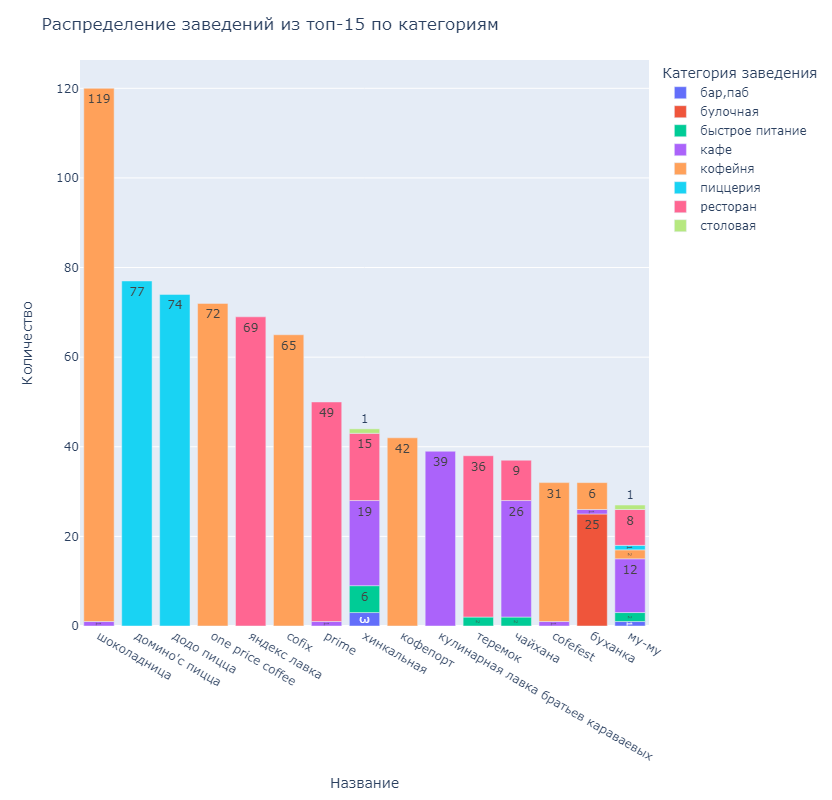

Крупными сетевиками являются кофейни и пицерии. В частности, это Шоколадница, Домино'с и Додо Пицца. Также наблюдаем, что некоторые из сетевых заведений имеют несколько категорий.

### Количество заведений в административных районах Москвы.

In [ ]:
data.district.value_counts()

Центральный административный округ         2242
Северный административный округ             899
Южный административный округ                892
Северо-Восточный административный округ     890
Западный административный округ             850
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

In [ ]:
data_district = data.groupby(['district', 'category']).agg({'address':'count'}).reset_index()
data_district = data_district.rename(columns={'address':'count'})
data_district.sample(15)

,district,category,count
29,Северо-Восточный административный округ,пиццерия,68
68,Южный административный округ,кофейня,131
69,Южный административный округ,пиццерия,73
16,Северный административный округ,"бар,паб",68
67,Южный административный округ,кафе,264
1,Восточный административный округ,булочная,25
22,Северный административный округ,ресторан,188
43,Центральный административный округ,кафе,464
32,Северо-Западный административный округ,"бар,паб",23
54,Юго-Восточный административный округ,ресторан,145


In [ ]:
fig = px.bar(data_district,
             x='count',
             y='district',
             color='category'
            )
fig.update_layout(title = 'Количество заведений каждой категории по районам Москвы',
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Название района',
                  yaxis={'categoryorder': 'total ascending'},
                  legend=dict(
    title="Категория заведения")
)
fig.show()

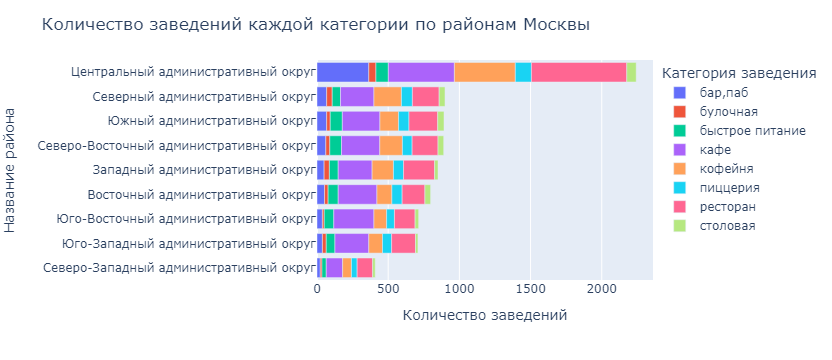

Очевидно, подавляющее количество заведений располагается в ЦАО. В центре города преобладают такие категории заведений, как кафе, бары и рестораны.

### Средние рейтинги по категориям заведений.

In [ ]:
data_rating = data.groupby('category').agg({'rating': 'mean'}).round(2).sort_values('rating', ascending=False).reset_index()
data_rating

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [ ]:
fig = px.bar(data_rating,
             x='rating',
             y='category',
             text='rating',
             color_discrete_sequence = px.colors.sequential.Aggrnyl
            )
fig.update_layout(title='Средние рейтинги по категориям заведений',
                  xaxis_title='Рейтинг',
                  yaxis_title='Категории заведений')
fig.update_xaxes(range=[4, 4.5])
fig.show()

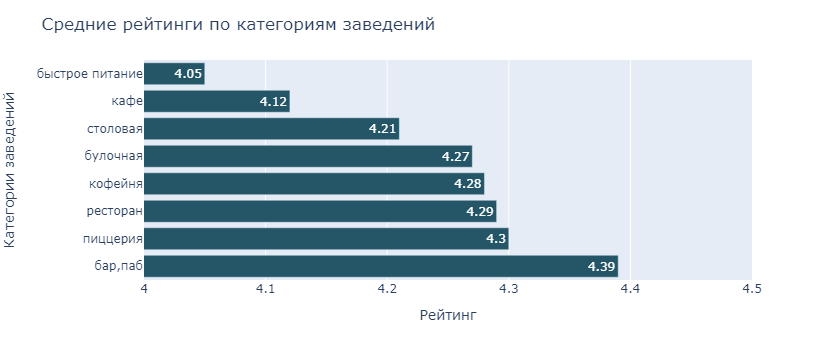

Из визуализации наблюдаем, что самый высокий средний бал имеют бары и пабы - в виду основной причины времяпрепровождения в них это неудивительно. В то же время в точках фастфуда потребность в высоком качестве продукции гораздо выше.

### Средний рейтинг заведений каждого района.

In [ ]:
#Вычислим средний рейтинг заведений каждого района
district_rating = data.groupby('district')['rating'].mean().reset_index().sort_values(by ='rating', ascending = False).round(2)
district_rating

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
8,Южный административный округ,4.18
1,Западный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [ ]:
#Загрузим JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423

#Создадим карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

#Создадим хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

#Вывод карты
m

Наиболее высокий средний рейтинг у заведений в центре и на северо-западе Москвы.

### Кластеры заведений.

In [ ]:
moscow_lat, moscow_lng = 55.751244, 37.618423

#Cоздадим карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
#Создадим пустой кластер, добавим его на карту
marker_cluster = MarkerCluster().add_to(m)

#Функция, принимающая строку датафрейма, создает маркер в текущей точке и добавляет его в кластер marker_cluster

def create_cluster(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
    
#К каждой строке датафрейма применим функцию
data.apply(create_cluster, axis=1)

#Вывод карты
m

Наиболее крупные кластеры сосредоточены ближе к центру столицы.

### Топ-15 улиц по количеству заведений.

In [ ]:
#Топ-15 улиц по количеству заведений
top15_street = data.groupby('street').agg({'name' : 'count'})
top15_street = top15_street.rename(columns={'name':'count'})
top15_street = top15_street.sort_values('count', ascending = False).reset_index().head(15)
top15_street

,street,count
0,проспект Мира,183
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [ ]:
#Сгруппируем по категориям
data_street = data.groupby(['street', 'category'])['name'].count().reset_index()
data_street.columns = ['street', 'category', 'count']
data_street

,street,category,count
0,1-й Автозаводский проезд,кафе,1
1,1-й Балтийский переулок,ресторан,1
2,1-й Варшавский проезд,кафе,1
3,1-й Вешняковский проезд,кафе,1
4,1-й Волоколамский проезд,кафе,1
...,...,...,...
3817,шоссе Энтузиастов,кафе,10
3818,шоссе Энтузиастов,кофейня,7
3819,шоссе Энтузиастов,пиццерия,2
3820,шоссе Энтузиастов,ресторан,7


In [ ]:
#Оставим улицы только из топ-15
top15_street_new = data_street[data_street['street'].isin(top15_street['street'])]
top15_street_new.sample(15)

,street,category,count
870,Дмитровское шоссе,кафе,23
1366,Люблинская улица,ресторан,10
2859,проспект Мира,быстрое питание,21
2858,проспект Мира,булочная,4
1986,Профсоюзная улица,"бар,паб",6
3438,улица Миклухо-Маклая,ресторан,15
1079,Каширское шоссе,пиццерия,5
1383,МКАД,столовая,1
1249,Кутузовский проспект,"бар,паб",2
871,Дмитровское шоссе,кофейня,11


In [ ]:
fig = px.bar(top15_street_new.sort_values(by='count', ascending=True), 
             x='count',
             y='street',               
             color='category'
            )
fig.update_layout(title='График распределения количества заведений и их категорий по улицам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Улица',  
                   yaxis={'categoryorder':'total ascending'},
                   width=1000, 
                   height=600,
                  legend=dict(
    title="Категория заведения")
                 )
fig.show()

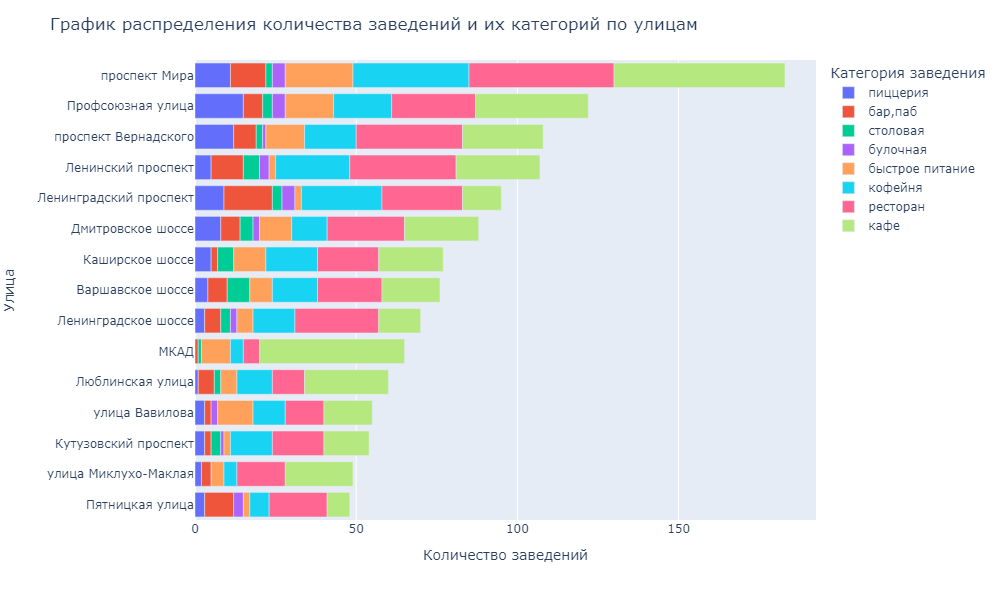

Как видим, на самых популярных улицах Москвы преобладают такие категории заведений как кафе, рестораны и кофейни.

### Одна улица - один объект общепита.

In [ ]:
one_catering = data['street'].value_counts().reset_index()
one_catering.columns = ['street', 'count']
one_catering = one_catering[one_catering['count']==1]
one_catering

,street,count
990,1-й Колобовский переулок,1
991,Газгольдерная улица,1
992,Композиторская улица,1
993,Коптевский бульвар д 18 А стр 1,1
994,Красностуденческий проезд,1
...,...,...
1443,улица Ремизова,1
1444,природно-исторический парк Измайлово,1
1445,улица Ивана Франко,1
1446,площадь Савёловского Вокзала,1


In [ ]:
#Выясним, какую часть от общего количества составляют улицы с одним заведением
one_catering_ratio = one_catering['street'].nunique()/data['street'].nunique()*100
round(one_catering_ratio, 2)

31.63

In [ ]:
#Выявим категории, к которым относятся заведения
one_catering_category = data_street[data_street['street'].isin(one_catering['street'])]
one_catering_category = one_catering_category.groupby('category')['street'].count().sort_values(ascending=False)
one_catering_category

category
кафе               160
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: street, dtype: int64

In [ ]:
#Построим график
fig = px.bar(one_catering_category, text="value", color_discrete_sequence = px.colors.sequential.Aggrnyl)
fig.update_layout(
    title="Распределение одного заведения на одной улице по категориям",
    xaxis_title="Категории заведений",
    yaxis_title="Количество заведений",
    showlegend=False
)
fig.show()

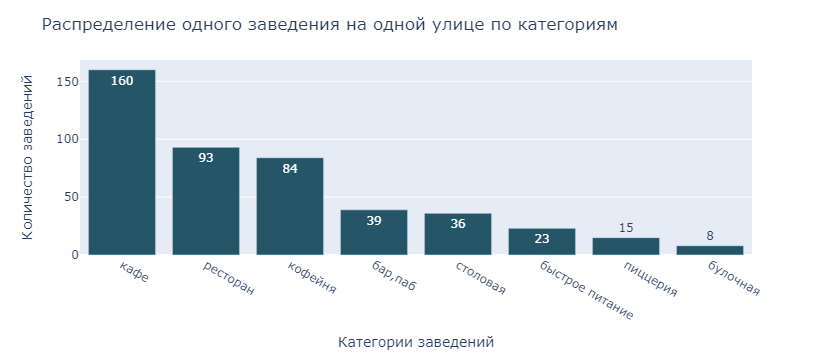

Всего 458 улиц имеет по одному заведению, что составляет 31,63% от общего количества. Преобладающей категорией заведений общественного питания является кафе - 160 шт.

### Средний чек заведений.

In [ ]:
#Посчитаем медианное значение среднего чека для заведений каждого района
median_avg_bill = data.groupby('district')['middle_avg_bill'].median().reset_index().sort_values(by='middle_avg_bill', ascending = False)
median_avg_bill

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [ ]:
#Создаем карту Москвы

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

#Хороплет
Choropleth(
    geo_data=state_geo,
    data = median_avg_bill,
    columns = ['district', 'middle_avg_bill'],
    key_on = 'feature.name',
    legend_name = 'Ценовой индикатор района',
).add_to(m)

#Вывод карты
m

Самыми дорогими районами ожидаемо являются ЗАО и ЦАО - средний чек составляет 1000 рублей. Наименьшее же медианное значение среднего чека в в Юго-Восточном административном округе. Средний чек в центральном и западном административных округах от остальных отличается в среднем в 1,5 - 2 раза.

### Общий вывод.

1) Наибольшее количество заведений представлено в трёх категориях:
- кафе - 2377 или 28.3% от общего числа
- ресторан - 2042 или 24.3%  от общего числа
- кофейня - 1413 или 16.8% от общего числа<br>
Наименьшее количество заведений представлено в двух категориях:
- столовая - 315 или 3.75% от общего числа
- булочная - 256 или 3.05% от общего числа

2) Меньше всего посадочных мест в заведениях, рассчитанных на непродолжительное пребывание посетителей - кафе, пиццерия, булочная. В свою очередь, рестораны и бары обладают наибольшим количеством мест.

3) Более 60% заведений Москвы несетевые.

4) Наиболее индивидуальными заведениями являются, как правило, бары и пабы. В свою очередь, подавляющее количество булочных имеет сетевую структуру - более 60%.

5) Крупными сетевиками являются кофейни и пицерии. В частности, это Шоколадница, Домино'с и Додо Пицца.

6) Подавляющее количество заведений располагается в ЦАО. В центре города преобладают такие категории заведений, как кафе, бары и рестораны.

7) Самый высокий средний бал имеют бары и пабы - в виду основной причины времяпрепровождения в них это неудивительно. В то же время в точках фастфуда потребность в высоком качестве продукции гораздо выше.

8) Наиболее высокий средний рейтинг у заведений в центре и на северо-западе Москвы.

9) На самых популярных улицах Москвы преобладают такие категории заведений как кафе, рестораны и кофейни.

10) Всего 458 улиц имеет по одному заведению, что составляет 31,63% от общего количества. Преобладающей категорией заведений общественного питания является кафе - 160 шт.

11) Самыми дорогими районами ожидаемо являются ЗАО и ЦАО - средний чек составляет 1000 рублей. Наименьшее же медианное значение среднего чека в в Юго-Восточном административном округе. Средний чек в центральном и западном административных округах от остальных отличается в среднем в 1,5 - 2 раза.

## Детализация исследования: открытие кофейни

### Сколько кофеен в датасете? В каких районах их больше всего?

In [ ]:
#Посчитаем количество кофеен в датасете
coffee_house = data[data['category'] == 'кофейня']
print('Количество кофеен:', len(coffee_house))

Количество кофеен: 1413


In [ ]:
#Выясним, в каких районах города их больше всего
district_count = data.query('category== "кофейня"').groupby('district')['name'].count().reset_index().sort_values(by='name')
district_count

,district,name
4,Северо-Западный административный округ,62
6,Юго-Восточный административный округ,89
7,Юго-Западный административный округ,96
0,Восточный административный округ,105
8,Южный административный округ,131
1,Западный административный округ,150
3,Северо-Восточный административный округ,159
2,Северный административный округ,193
5,Центральный административный округ,428


In [ ]:
#Построим график
fig = px.bar(district_count, y='district', x='name', text='name', color_discrete_sequence = px.colors.sequential.Aggrnyl)
fig.update_layout(
    title="Распределение кофеен по районам города",
    xaxis_title="Количество заведений",
    yaxis_title="Районы города"
)
fig.show()

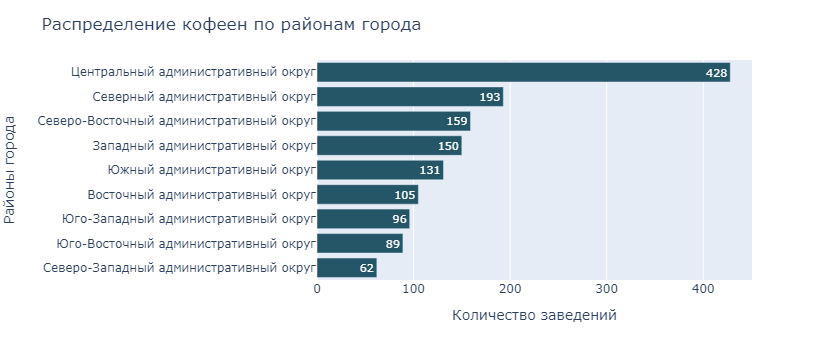

Максимальное количество - 428 кофеен находится Центральном административном округе. Гораздо меньше их в остальных округах, приблизительно в 2-5 раз. В Северо-Западном округе же их всего 62.

### Круглосуточные кофейни.

In [ ]:
#Проверим, сколько всего круглосуточных кофеен
coffee_24 = coffee_house[coffee_house['is_24/7']==True]
print('Количество круглосуточных кофеен:', len(coffee_24))

Количество круглосуточных кофеен: 59


In [ ]:
#Построим визуализацию, отражающую долю круглосуточных кофеен от общего числа
labels = ['Круглосуточные кофейни', 'Дневное время работы'] 
values = [coffee_house[coffee_house['is_24/7']==True]['name'].count(), (
    coffee_house['name'].count())-(coffee_house[coffee_house['is_24/7']==True]['name'].count())]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, pull=[0.15, 0])])
fig.update_layout(title_text="Соотношение круглосуточных кофеен")
fig.show() 

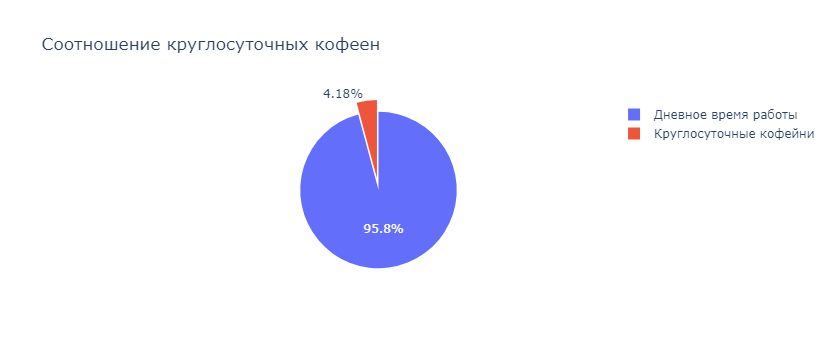

Всего в Москве 59 круглосуточных кофеен, что составляет не более 5% от общего количества заведений данной категории.

In [ ]:
#Создадим карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
#Создадим пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

#Напишем функцию, которая принимает строку датафрейма
#Создадим маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

#Применим функцию create_clusters() к каждой строке датафрейма
coffee_24.apply(create_clusters, axis=1)

#Вывод карты
m

Как видим, круглосуточные кофейни преимущественно размещены в центре. Что вполне логично - многие местные жители и туристы любят погулять ночью с кофе в самой насыщенной жизнью части города.

### Распределение рейтинга кофеен по районам.

In [ ]:
#Проверим распределение среднего значения рейтинга кофеен по районам
coffee_rating = coffee_house.groupby('district')['rating'].mean().reset_index().round(2).sort_values(by = 'rating', ascending = False)
coffee_rating

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


In [ ]:
#Cоздадим карту
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

#Cоздадим хороплет с помощью конструктора Choropleth и добавим его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

#Вывод карты
m

И снова пальма первенства принадлежит Центральному административному округу, также практически не отстает от него Северо-Западный. Чего не скажешь о ЗАО - обладателе самого низкого среднего рейтинга по кофейням.

### Ориентировочная стоимость чашки капучино при открытии кофейни.

In [ ]:
#Отобразим сводную статистику расценок одной чашки капучино
coffee_house['middle_coffee_cup'].describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

Наблюдаем, что среднее и медианное значение стоимости одной чашки капучино можно сказать не отличается и составляет около 170 рублей. А также стоимость одной чашки находится в диапазоне цены от 60 до 1568 рублей.

In [ ]:
cappuccino = coffee_house.groupby('district')['middle_coffee_cup'].mean().round(0).reset_index().sort_values(
    by='middle_coffee_cup')
cappuccino

,district,middle_coffee_cup
6,Юго-Восточный административный округ,151.0
8,Южный административный округ,158.0
3,Северо-Восточный административный округ,165.0
2,Северный административный округ,166.0
4,Северо-Западный административный округ,166.0
0,Восточный административный округ,174.0
7,Юго-Западный административный округ,184.0
5,Центральный административный округ,188.0
1,Западный административный округ,190.0


In [ ]:
#Построим график
fig = px.bar(cappuccino, y='district', x='middle_coffee_cup', text='middle_coffee_cup', color_discrete_sequence = px.colors.sequential.Aggrnyl)
fig.update_layout(
    title="Стоимость чашки капучино в разных районах города",
    xaxis_title="Стоимость одной чашки капучино, руб",
    yaxis_title="Районы города"
)
fig.update_xaxes(range=[100, 200])
fig.show()

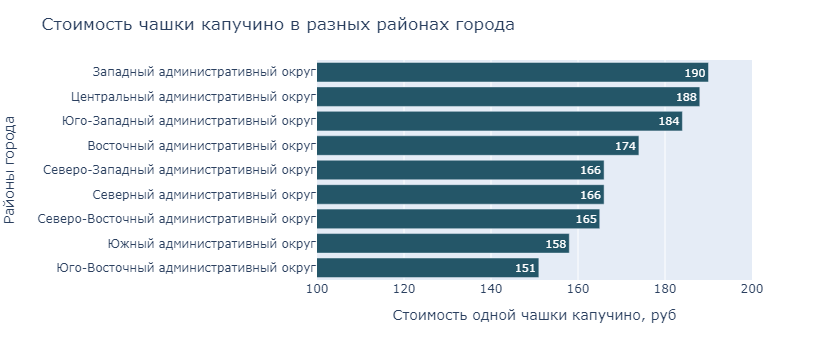

Как видим, дороже всего чашка кофе обойдется в ЗАО. В то же время, в Юго-Восточном административном округе можно приобрести один из самых дешевых капучино.

**Вывод**
-  Кофеен в Москве достаточно много - 1413, они входят в топ-3 распространённых категорий заведений и составляют 16.8% от общего количества. Максимальное количество - 428 кофеен находится Центральном административном округе. Округи, в которых наименьшая конкуренция - ЮЗАО, ЮВАО и СЗАО.
- Количество круглосуточных кофеен - 59, что составляет менее 5% от общего количества заведений данной категории.
- В целом категория кофеен имеет рейтинг 4.28, в частности же, самый высокий рейтинг в Центральном административном округе, который составляет 4.34. А наименьший в ЗАО - 4.20.
- Средняя стоимость чашки капучино, на которую стоит ориентироваться при открытии, должна составлять не более среднего значения в 175 рублей, иначе качество продукта вновь открывшейся кофейни должно явно выделяться из общей массы функционирующих заведений со своими постоянными клиентами.